In [1]:
pip install transformers accelerate safetensors diffusers

Note: you may need to restart the kernel to use updated packages.


In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
pip install torchvision


Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install patch-ng


Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install gfpgan


  Using cached gfpgan-1.3.8-py3-none-any.whl.metadata (12 kB)
Using cached gfpgan-1.3.8-py3-none-any.whl (52 kB)
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install realesrgan


Note: you may need to restart the kernel to use updated packages.


In [7]:
import os
import requests
import base64
import cv2
import torch
from torchvision import models, transforms
from PIL import Image
import GFPGAN
from GFPGAN.gfpgan.utils import GFPGANer
from realesrgan.utils import RealESRGANer
from basicsr.archs.srvgg_arch import SRVGGNetCompact
from IPython.display import display
import os
import requests
from diffusers import DiffusionPipeline, StableDiffusionXLImg2ImgPipeline 
from torchvision.transforms.functional import to_tensor, normalize, convert_image_dtype

In [8]:
# URLs for the different model weights
model_urls = {
    # This dictionary contains URLs from which the model weights can be downloaded.
    # Each key is a model file name and the corresponding value is the download URL.
    'realesr-general-x4v3.pth': "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.5.0/realesr-general-x4v3.pth",
    'GFPGANv1.4.pth': "https://github.com/TencentARC/GFPGAN/releases/download/v1.3.0/GFPGANv1.4.pth",
    #'RestoreFormer.pth': "https://github.com/TencentARC/GFPGAN/releases/download/v1.3.4/RestoreFormer.pth",
    #'CodeFormer.pth': "https://github.com/TencentARC/GFPGAN/releases/download/v1.3.4/CodeFormer.pth",
}

# Create a directory for the weights if it doesn't exist
os.makedirs('weights', exist_ok=True)

# This function downloads a file from a given URL and saves it with the specified filename.
# It streams the content, writing it in chunks to handle large files without consuming too much memory.
# It also prints out the status of the download.
def download_file(url, filename):
    response = requests.get(url, stream=True)
    if response.status_code == 200:
        with open(filename, 'wb') as f:
            for chunk in response.iter_content(chunk_size=1024):
                f.write(chunk)
        print(f"Downloaded {filename}")
    else:
        print(f"Failed to download {filename}. Status code: {response.status_code}")

# This loop goes through the dictionary of model URLs, checks if the file already exists locally,
# and if not, it uses the 'download_file' function to download and save the weights.
for filename, url in model_urls.items():
    file_path = os.path.join('weights', filename)
    if not os.path.exists(file_path):
        print(f"Downloading {filename}...")
        download_file(url, file_path)
    else:
        print(f"{filename} already exists. Skipping download.")

realesr-general-x4v3.pth already exists. Skipping download.
GFPGANv1.4.pth already exists. Skipping download.


In [9]:
# This line of code prints the list of files in the 'weights' directory.
# It's used to verify that the required model weights have been downloaded successfully.
print(os.listdir('weights'))

['GFPGANv1.4.pth', 'realesr-general-x4v3.pth']


In [10]:
# Load RealESRGAN model
realesrgan_model_path = 'weights/realesr-general-x4v3.pth'

# Initialize RealESRGAN
sr_model = SRVGGNetCompact(num_in_ch=3, num_out_ch=3, num_feat=64, num_conv=32, upscale=4, act_type='prelu')
half = True if torch.cuda.is_available() else False
realesrganer = RealESRGANer(scale=4, model_path=realesrgan_model_path, model=sr_model, tile=0, tile_pad=10, pre_pad=0, half=half)

# Function to upscale image with RealESRGAN
def upscale_image(image_path, output_path):
    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    # Upscale the image with RealESRGAN
    output, _ = realesrganer.enhance(img, outscale=4)
    cv2.imwrite(output_path, output)
    return output

In [11]:
# Load GFPGAN model
gfpgan_model_path = 'weights/GFPGANv1.4.pth'

# Initialize GFPGAN
face_enhancer = GFPGANer(model_path=gfpgan_model_path, upscale=10, arch='clean', channel_multiplier=2, bg_upsampler=realesrganer)

# Function to enhance image with GFPGAN
def enhance_faces(image_path, output_path):
    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    # Enhance faces with GFPGAN
    _, _, img_enhanced = face_enhancer.enhance(img, has_aligned=False, only_center_face=False, paste_back=True)
    cv2.imwrite(output_path, img_enhanced)
    return img_enhanced

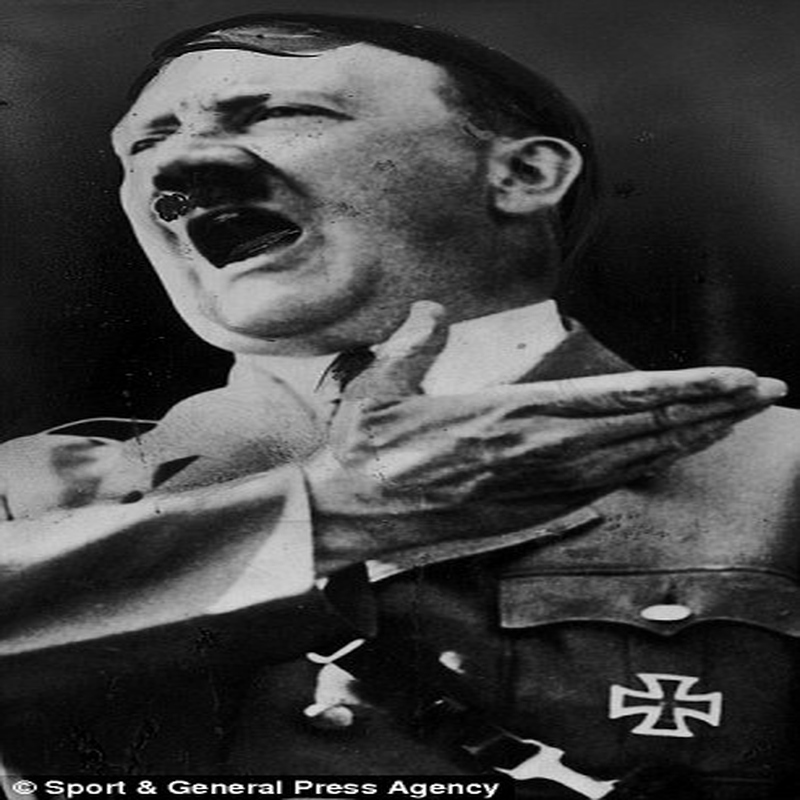

In [28]:
initial_image_path = 'GFPGAN/inputs/cropped_faces/demo3.jpg'
# Load the image with PIL
photo = Image.open(initial_image_path)
# Display the image with a specific max width and height
display(photo.resize((800, 800), Image.LANCZOS))

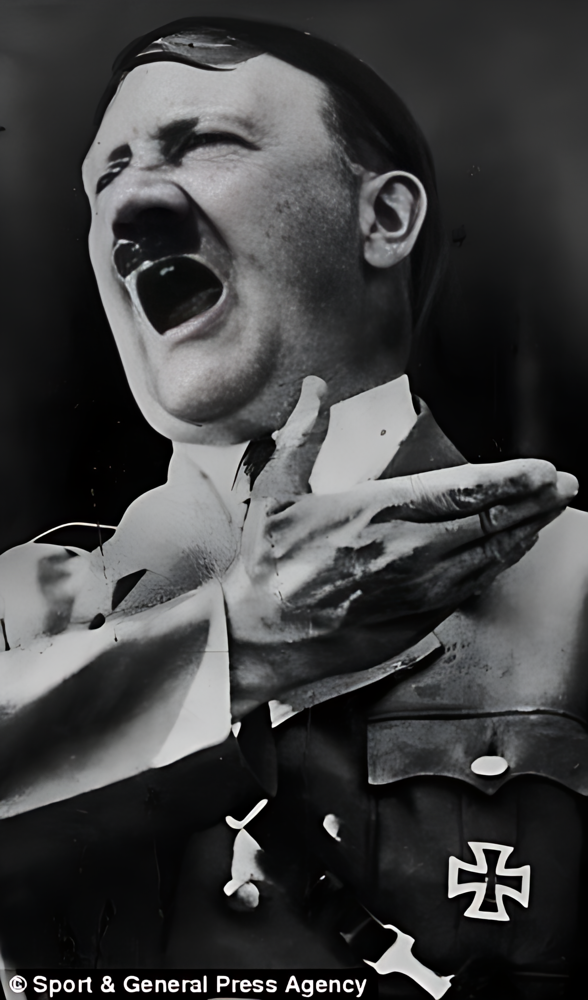

In [29]:
# Enhance faces in the image
# Calls a function to enhance faces in the refined image using GFPGAN.
# Saves the image with enhanced faces locally and displays it within the notebook.
# Handles exceptions during the face enhancement process.

# Define the path for the enhanced faces image
enhanced_faces_path = "GFPGAN/output/enhanced_image.png"


# applies face enhancement, and saves the result to a new file
enhance_faces(initial_image_path, enhanced_faces_path)

# Display the image with enhanced faces
    # Open the enhanced image from the saved path
enhanced_image_to_display = Image.open(enhanced_faces_path)
display(enhanced_image_to_display)
